<img src="grizli_logo.png">

# Basic Grizli tutorial 

What we'll be going over in this tutorial:

1) Selecting a field to extract data from

2) Automatically reducing data using Grizli's auto_script.go feature

3) Extracting data and overview of data products

4) How to interact with data

This tutorial is based upon the <a href="https://github.com/gbrammer/grizli/blob/master/examples/Grizli-Pipeline.ipynb">Grizli-Pipeline</a> demo which includes a more indepth breakdown of the reduction process. 


The easiest way to install Grizli is to use the grizli-dev python environment (which should install all dependices), instructions for installation are included <a href="https://grizli.readthedocs.io/en/master/">here</a>. 

In [15]:
import glob
import time
import os
import sys
import yaml

import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image

from astropy.io import fits
from astropy.table import Table

import drizzlepac

import warnings
warnings.filterwarnings('ignore')

from mastquery import query, overlaps

import grizli
from grizli.pipeline import auto_script
from grizli import utils, fitting, multifit, prep
HOME_PATH = os.getcwd()


## Step 1 - Select a field and run an archive query with mastquery


# (Mon May 17 09:51:52 2021)

query.run_query(**{'kwargs': {'proposal_id': [], 'instruments': ['WFC3/IR', 'ACS/WFC'], 'filters': ['F105W', 'G102', 'G141']}, 'base_query': {'intentType': ['science'], 'mtFlag': ['False'], 'obs_collection': ['HST'], 't_exptime': [1, 1000000.0], 'project': ['HST']}, 'position_box': True, 'sort_column': ['obs_id', 'filter'], 'rename_columns': {'t_exptime': 'exptime', 'target_name': 'target', 's_region': 'footprint', 's_ra': 'ra', 's_dec': 'dec', 'filters': 'filter'}, 'get_exptime': True, 'box': [53.15796, -27.7282, 1.5]})


Parse polygons
Parse    1 (N=1)
Parse    2 (N=2)
Parse    3 (N=2)
Parse    4 (N=2)
Parse    5 (N=2)
Parse    6 (N=2)
Parse    7 (N=2)
Parse    8 (N=2)
Parse    9 (N=2)
Parse   10 (N=2)
Parse   11 (N=2)
Parse   12 (N=2)
Parse   13 (N=2)
Parse   14 (N=2)
Parse   15 (N=2)
Parse, iter 1,    1
Iter #1, N_Patch = 1
Iter #2, N_Patch = 1


 1 j033236m2744 53.15820836642586 -27.7343775186869

# (Mon May 17 09:51:54 2021)

query.run_query(**{'kwa

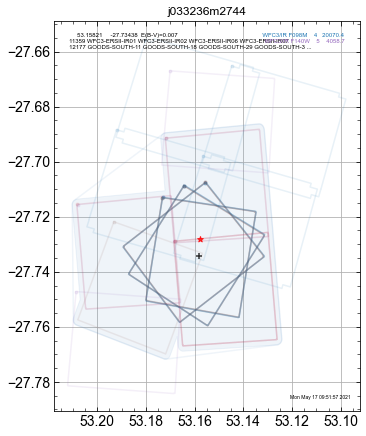

In [2]:
## First we need to define a few parameters for the query
base_query= {'intentType': ['science'], 'mtFlag': ['False'], 'obs_collection': ['HST'], 't_exptime':[1,1E6], 'project':['HST']}

## Second we will run an archive query, this can be done either using a proposal id (left blank here) or by defining a box to 
## search over (here we'll be using one of the CLEAR fields). We also need to tell mastquery which instruments we want to query
## and which filters. 
parent = query.run_query(box=[53.15796,-27.72820, 1.5], proposal_id=[],
                         instruments=['WFC3/IR', 'ACS/WFC'],
                         filters=['F105W','G102', 'G141'], base_query=base_query)

## Third we will look for overlaps. Here we can include additional filters which overlap with our current filters + the buffer_arcmin.
tabs = overlaps.find_overlaps(parent,  buffer_arcmin=0.1,
                              filters=['F098M','F140W'], 
                              close=False, base_query=base_query)


## Step 2 - Reduce the data

In [3]:
from grizli.pipeline.auto_script import get_yml_parameters

## Read the default parameters that can be edited and passed en-masse to `auto_script.go`
kwargs = get_yml_parameters()
print(list(kwargs.keys()))

root = 'j033240m2744'

############# need to check
kwargs['fetch_files_args']['reprocess_clean_darks'] = False 
kwargs['fetch_files_args']['reprocess_parallel'] = True

## Set to True for parallel programs like WISPS
IS_PARALLEL = False
kwargs['is_parallel_field'] = IS_PARALLEL

['filters', 'fetch_files_args', 'inspect_ramps', 'is_dash', 'run_prepare_dash', 'run_parse_visits', 'is_parallel_field', 'parse_visits_args', 'manual_alignment', 'manual_alignment_args', 'preprocess_args', 'visit_prep_args', 'redo_persistence_mask', 'persistence_args', 'run_fine_alignment', 'fine_backup', 'fine_alignment_args', 'make_mosaics', 'mosaic_args', 'mosaic_drizzle_args', 'mask_spikes', 'mosaic_driz_cr_type', 'make_phot', 'multiband_catalog_args', 'only_preprocess', 'overwrite_fit_params', 'grism_prep_args', 'refine_with_fits', 'run_extractions', 'include_photometry_in_fit', 'make_thumbnails', 'thumb_rgb_params', 'drizzler_args', 'thumbnail_args', 'extract_args', 'extract_maglim', 'run_fit']


In [4]:
## The next step is to run auto_script.go, this will fetch the data from 
## the HST archive, parse visit associations, align images, sky subtraction, 
## fine alignment using GAIA DR2, generate a photometric catalog, and model the contamination iterativly. 


## auto_script.go can take a while (this field takes around an hour on my computer), therefore
## we won't be running it today, rather I have provided the *GrismFLT.fits files. 
if False:
    auto_script.go(root=root, HOME_PATH=HOME_PATH, **kwargs)

In [10]:
### set to path to the grizli data directory
EXTRACT_PATH = 'grizli_example_data/'

## Step 3 - Extracting spectra

#### We can skip straight to extracting data with only the *GrismFLT.fits files and the *ir.cat.fits catalog using the multifit.GroupFLT function.

In [6]:
grp = multifit.GroupFLT(grism_files=glob.glob(EXTRACT_PATH + '*GrismFLT.fits'), 
                            catalog=EXTRACT_PATH + '{}-ir.cat.fits'.format(root), 
                            cpu_count=-1, sci_extn=1, pad=256)

Load grizli_example_data/ibhj33u3q.01.GrismFLT.fits!
Load grizli_example_data/icxt34emq.01.GrismFLT.fits!
Load grizli_example_data/icxt35s9q.01.GrismFLT.fits!
Load grizli_example_data/icxt31r1q.01.GrismFLT.fits!
Load grizli_example_data/ibhj29ncq.01.GrismFLT.fits!
Load grizli_example_data/icxt34erq.01.GrismFLT.fits!
Load grizli_example_data/icxt32npq.01.GrismFLT.fits!
Load grizli_example_data/icxt33rsq.01.GrismFLT.fits!
Load grizli_example_data/ibhj11hpq.01.GrismFLT.fits!
Load grizli_example_data/icxt32nmq.01.GrismFLT.fits!
Load grizli_example_data/icxt33ruq.01.GrismFLT.fits!
Load grizli_example_data/icxt31r6q.01.GrismFLT.fits!
Load grizli_example_data/icxt33rpq.01.GrismFLT.fits!
Load grizli_example_data/icxt31r3q.01.GrismFLT.fits!
Load grizli_example_data/icxt34epq.01.GrismFLT.fits!
Load grizli_example_data/icxt32nlq.01.GrismFLT.fits!
Load grizli_example_data/ibhj11hiq.01.GrismFLT.fits!
Load grizli_example_data/icxt32nrq.01.GrismFLT.fits!
Load grizli_example_data/ibhj11hwq.01.GrismFLT

#### Contamination modeling, through an iterative process Grizli models continua of sources.

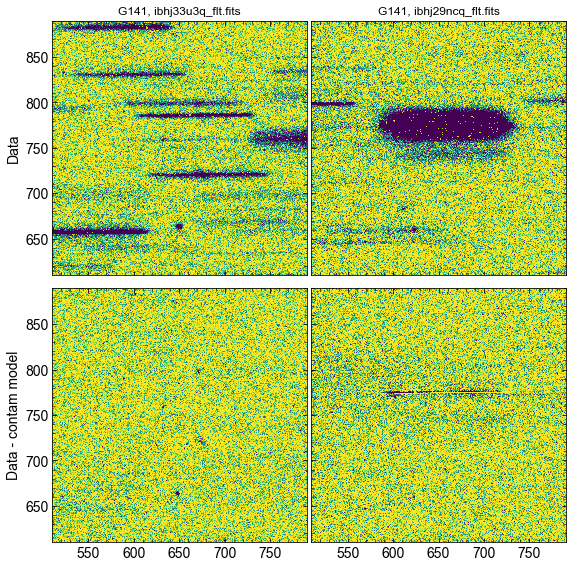

In [7]:
# Show the results of the contamination model
### Show FLT residuals
cmap = 'viridis_r'
vm = [-0.01, 0.1]

fig = plt.figure(figsize=[8,8])
ax = fig.add_subplot(221)
flt = grp.FLTs[0] # G102

ax.imshow(flt.grism['SCI'], vmin=vm[0], vmax=vm[1], cmap=cmap,
          interpolation='Nearest', origin='lower')
ax.set_title('{0}, {1}'.format(flt.grism.filter, flt.grism.parent_file))
ax.set_xticklabels([])
ax.set_ylabel('Data')

ax = fig.add_subplot(223)
ax.imshow(flt.grism['SCI'] - flt.model, vmin=vm[0], vmax=vm[1], cmap=cmap,
          interpolation='Nearest', origin='lower')

ax.set_ylabel('Data - contam model')

ax = fig.add_subplot(222)
flt = grp.FLTs[4] # G141

ax.imshow(flt.grism['SCI'], vmin=vm[0], vmax=vm[1], cmap=cmap,
          interpolation='Nearest', origin='lower')
ax.set_title('{0}, {1}'.format(flt.grism.filter, flt.grism.parent_file))
ax.set_xticklabels([]); ax.set_yticklabels([])

ax = fig.add_subplot(224)
ax.imshow(flt.grism['SCI'] - flt.model, vmin=vm[0], vmax=vm[1], cmap=cmap,
          interpolation='Nearest', origin='lower')

ax.set_yticklabels([])

for ax in fig.axes:
    ax.set_xlim(510,790); ax.set_ylim(610,890)

fig.tight_layout(pad=1)

In [8]:
## Store fit parameters to `fit_args.npy` for batch-mode processing
os.chdir(EXTRACT_PATH)

## Drizzle parameters for line maps
pline = auto_script.DITHERED_PLINE

## Generate the parameter dictionary
args = auto_script.generate_fit_params(field_root=root, prior=None, 
                                       MW_EBV=tabs[0].meta['MW_EBV'], 
                                pline=pline, fit_only_beams=True, run_fit=True, poly_order=7, 
                                fsps=True, sys_err = 0.03, fcontam=0.2, zr=[0.05, 3.4], 
                                save_file='fit_args.npy')

Apply catalog corrections
Compute aperture corrections: i=0, D=0.36" aperture
Compute aperture corrections: i=1, D=0.50" aperture
Compute aperture corrections: i=2, D=0.70" aperture
Compute aperture corrections: i=3, D=1.00" aperture
Compute aperture corrections: i=4, D=1.20" aperture
Compute aperture corrections: i=5, D=1.50" aperture
Compute aperture corrections: i=6, D=3.00" aperture
Apply morphological validity class
Couldn't run morph classification from /Users/Vince.ec/miniconda3/envs/astroconda3.6/lib/python3.6/site-packages/grizli-1.2.dev1667-py3.6-macosx-10.9-x86_64.egg/grizli/data/sep_catalog_junk.pkl
Write j033240m2744_phot_apcorr.fits
/Users/Vince.ec/miniconda3/envs/astroconda3.6/lib/python3.6/site-packages/eazy/data/templates -> ./templates
/Users/Vince.ec/miniconda3/envs/astroconda3.6/lib/python3.6/site-packages/eazy/data/filters/FILTER.RES.latest -> ./FILTER.RES.latest
Read default param file: /Users/Vince.ec/miniconda3/envs/astroconda3.6/lib/python3.6/site-packages/eazy

In [20]:
IRcat = Table.read('j033240m2744-ir.cat.fits', format = 'fits').to_pandas()
IRcat.keys()

Index(['THRESH', 'NPIX', 'TNPIX', 'XMIN', 'XMAX', 'YMIN', 'YMAX', 'X', 'Y',
       'X2_IMAGE', 'Y2_IMAGE', 'XY_IMAGE', 'ERRX2', 'ERRY2', 'ERRXY',
       'A_IMAGE', 'B_IMAGE', 'THETA_IMAGE', 'CXX_IMAGE', 'CYY_IMAGE',
       'CXY_IMAGE', 'CFLUX', 'FLUX', 'CPEAK', 'PEAK', 'XCPEAK', 'YCPEAK',
       'XPEAK', 'YPEAK', 'FLAG', 'X_IMAGE', 'Y_IMAGE', 'NUMBER', 'RA', 'DEC',
       'X_WORLD', 'Y_WORLD', 'FLUX_ISO', 'FLUXERR_ISO', 'AREA_ISO', 'MAG_ISO',
       'KRON_RADIUS', 'KRON_RCIRC', 'FLUX_AUTO', 'FLUXERR_AUTO', 'BKG_AUTO',
       'FLAG_AUTO', 'AREA_AUTO', 'FLUX_RADIUS_FLAG', 'FLUX_RADIUS_20',
       'FLUX_RADIUS', 'FLUX_RADIUS_90', 'TOT_CORR', 'MAG_AUTO', 'MAGERR_AUTO',
       'FLUX_APER_0', 'FLUXERR_APER_0', 'FLAG_APER_0', 'BKG_APER_0',
       'MASK_APER_0', 'FLUX_APER_1', 'FLUXERR_APER_1', 'FLAG_APER_1',
       'BKG_APER_1', 'MASK_APER_1', 'FLUX_APER_2', 'FLUXERR_APER_2',
       'FLAG_APER_2', 'BKG_APER_2', 'MASK_APER_2', 'FLUX_APER_3',
       'FLUXERR_APER_3', 'FLAG_APER_3', 'BKG_APER_3'

In [21]:
IRcat[['NUMBER', 'RA', 'DEC']]

,NUMBER,RA,DEC
0,1,53.225096,-27.786708
1,2,53.220279,-27.786711
2,3,53.212262,-27.786713
3,4,53.198337,-27.786717
4,5,53.138346,-27.786717
...,...,...,...
1817,1818,53.146849,-27.689516
1818,1819,53.146386,-27.689430
1819,1820,53.145390,-27.689346
1820,1821,53.138804,-27.689014


In [22]:
## Find IDs of specific objects to extract using ra and dec
import astropy.units as u
tab = utils.GTable()
tab['ra'] = [53.15273]
tab['dec'] = [-27.71625]
idx, dr = grp.catalog.match_to_catalog_sky(tab)
print(grp.catalog['NUMBER'][idx])

source_id = grp.catalog['NUMBER'][idx][0]
tab['id'] = source_id
tab['dr'] = dr.to(u.mas)
tab['dr'].format='.1f'
tab.show_in_notebook()

NUMBER
------
  1490


idx,ra,dec,id,dr
,deg,deg,,mas
0,53.15273,-27.71625,1490,313.1


In [23]:
## Extract beams
auto_script.extract(field_root=root, ids=[source_id], MW_EBV=tabs[0].meta['MW_EBV'], 
                run_fit=False, grp=grp, diff=True)

0/1: 1490 28
j033240m2744_01490.beams.fits


True

In [24]:
ls *01490*

j033240m2744_01490.R30.fits    j033240m2744_01490.stack.fits
j033240m2744_01490.R30.png     j033240m2744_01490.stack.png
j033240m2744_01490.beams.fits


Run id=1490 with fit_args.npy
j033240m2744_01490.full.fits


(1490, 1, 244.08497285842896)

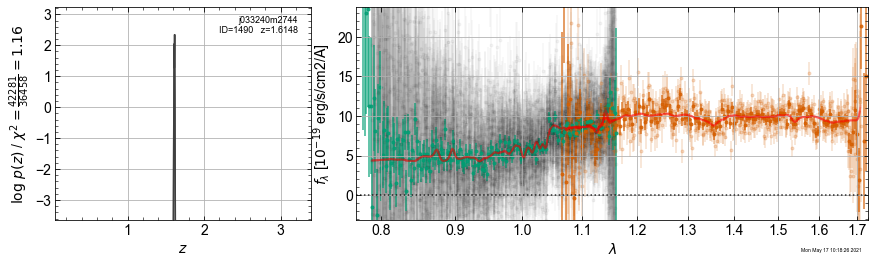

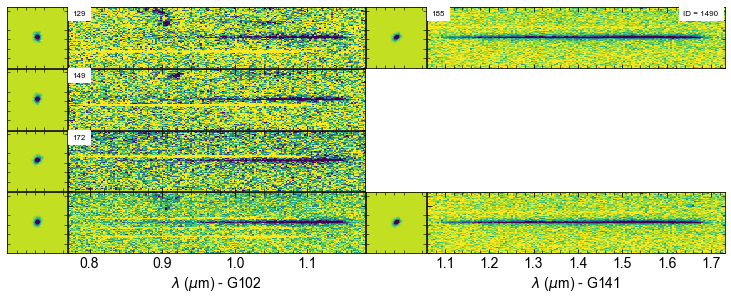

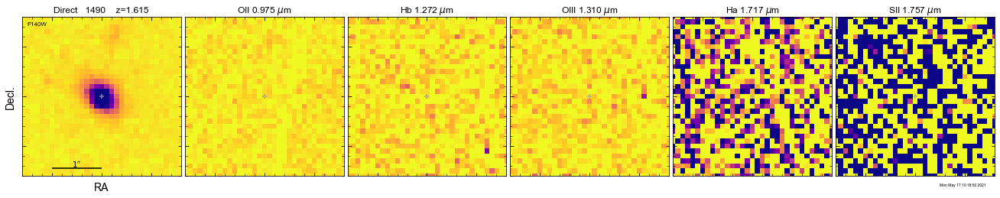

In [25]:
## fit the galaxy using a set of templates to fit redshift and the stellar populations, in addition to 
## generating line maps (though this has no emission lines)
fitting.run_all_parallel(source_id)

In [26]:
ls *01490*

j033240m2744_01490.1D.fits     j033240m2744_01490.line.png
j033240m2744_01490.R30.fits    j033240m2744_01490.log_par
j033240m2744_01490.R30.png     j033240m2744_01490.row.fits
j033240m2744_01490.beams.fits  j033240m2744_01490.stack.fits
j033240m2744_01490.full.fits   j033240m2744_01490.stack.png
j033240m2744_01490.full.png


In [28]:
fullfits =fits.open('j033240m2744_01490.full.fits')
fullfits.info()

Filename: j033240m2744_01490.full.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     160   ()      
  1  ZFIT_STACK    1 BinTableHDU     93   400R x 6C   [D, D, 45D, 2025D, D, D]   
  2  COVAR         1 ImageHDU       203   (73, 73)   float64   
  3  TEMPL         1 BinTableHDU    237   9929R x 3C   [D, D, D]   
  4  SEG           1 ImageHDU         8   (80, 80)   int32   
  5  DSCI        F105W ImageHDU        28   (80, 80)   float32   
  6  DWHT        F105W ImageHDU        28   (80, 80)   float32   
  7  DSCI        F140W ImageHDU        28   (80, 80)   float32   
  8  DWHT        F140W ImageHDU        28   (80, 80)   float32   
  9  LINE        SII ImageHDU        31   (80, 80)   float32   
 10  CONTINUUM   SII ImageHDU        31   (80, 80)   float32   
 11  CONTAM      SII ImageHDU        31   (80, 80)   float32   
 12  LINEWHT     SII ImageHDU        31   (80, 80)   float32   
 13  LINE        Ha  ImageHDU        31   (80, 80)  

In [29]:
## Now we'll extract a star-forming galaxy
source_id = 546
auto_script.extract(field_root=root, ids=[source_id], MW_EBV=tabs[0].meta['MW_EBV'], 
                run_fit=False, grp=grp, diff=True)

0/1: 546 28
j033240m2744_00546.beams.fits


True

Run id=546 with fit_args.npy
j033240m2744_00546.full.fits


(546, 1, 296.147500038147)

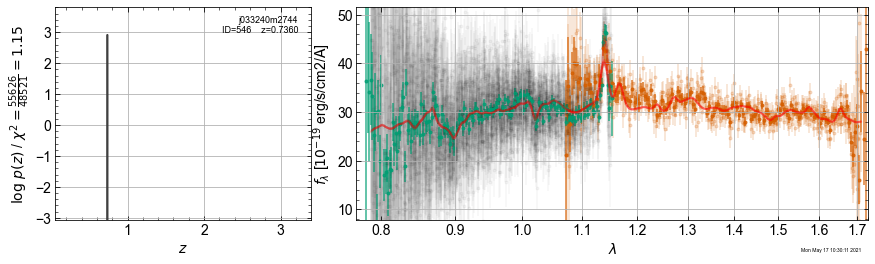

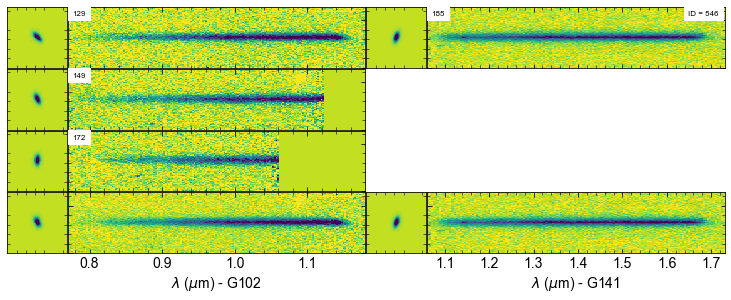

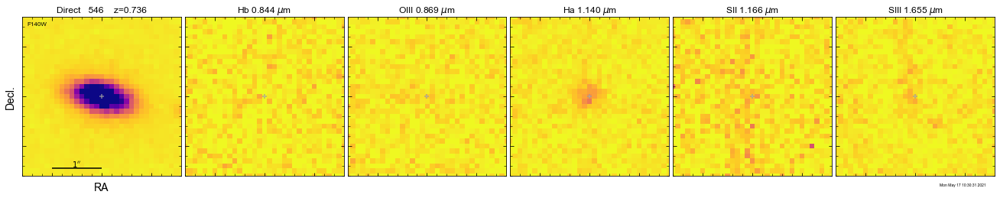

In [30]:
fitting.run_all_parallel(source_id)

In [35]:
## heres a galaxy with multiple emission lines
source_id = 1389
auto_script.extract(field_root=root, ids=[source_id], MW_EBV=tabs[0].meta['MW_EBV'], 
                run_fit=False, grp=grp, diff=True)

0/1: 1389 28
j033240m2744_01389.beams.fits


True

## Step 4 - Interacting with the data

In [36]:
from grizli import multifit

In [38]:
## multifit.MultiBeam reads in the *beams.fits files and allows you interact with the data.
## *beams.fits files contain cutouts of the beams along with the contamination
mb = multifit.MultiBeam('j033240m2744_01490.beams.fits')

load_master_fits: j033240m2744_01490.beams.fits
1 icxt34emq_flt.fits G102
2 icxt35s9q_flt.fits G102
3 icxt31r1q_flt.fits G102
4 icxt34erq_flt.fits G102
5 icxt32npq_flt.fits G102
6 icxt33rsq_flt.fits G102
7 ibhj11hpq_flt.fits G141
8 icxt32nmq_flt.fits G102
9 icxt33ruq_flt.fits G102
10 icxt31r6q_flt.fits G102
11 icxt33rpq_flt.fits G102
12 icxt31r3q_flt.fits G102
13 icxt34epq_flt.fits G102
14 icxt32nlq_flt.fits G102
15 ibhj11hiq_flt.fits G141
16 icxt32nrq_flt.fits G102
17 ibhj11hwq_flt.fits G141
18 icxt35sbq_flt.fits G102
19 icxt33roq_flt.fits G102
20 icxt34ekq_flt.fits G102
21 icxt35s6q_flt.fits G102
22 icxt30s7q_flt.fits G102
23 icxt30s2q_flt.fits G102
24 icxt35s4q_flt.fits G102
25 ibhj11i3q_flt.fits G141
26 icxt30s5q_flt.fits G102
27 icxt30s0q_flt.fits G102
28 icxt31r8q_flt.fits G102


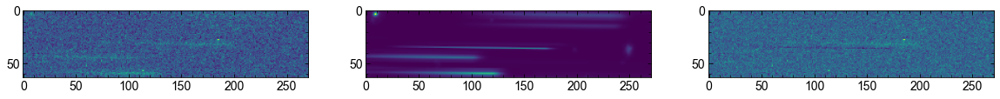

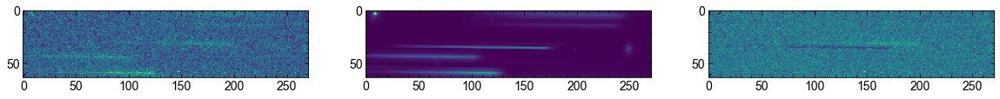

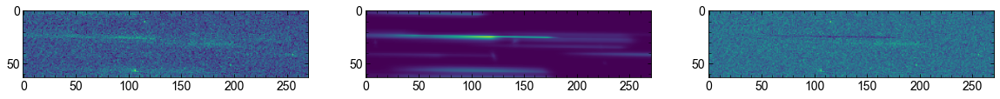

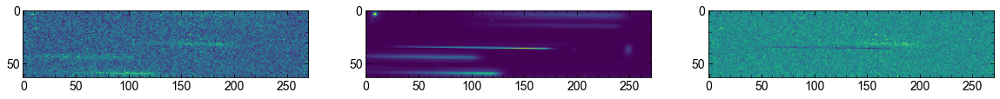

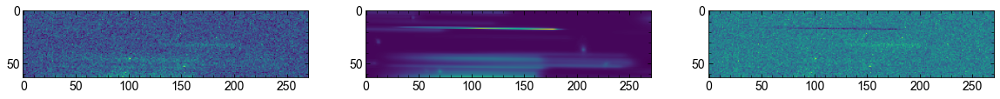

...

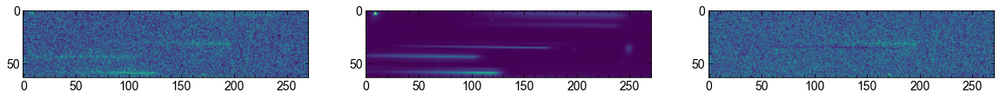

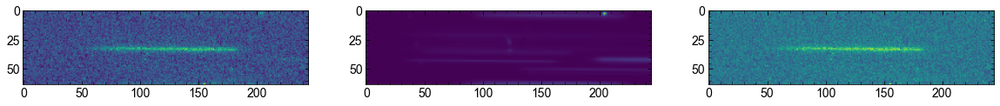

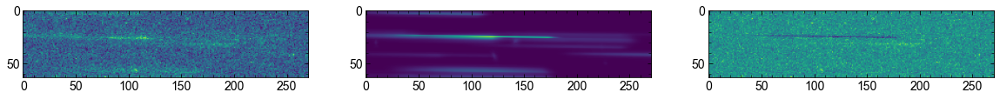

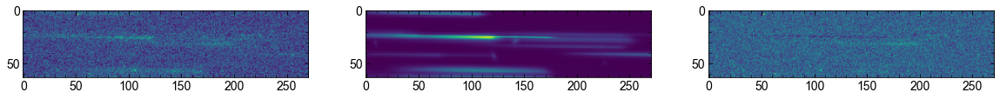

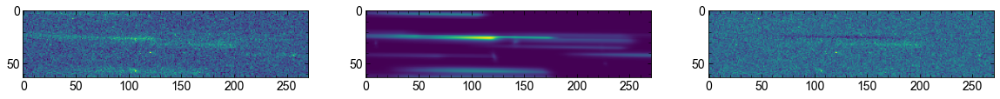

In [39]:
from matplotlib import gridspec
for beam in mb.beams:
    plt.figure(figsize = [20,5])
    gs = gridspec.GridSpec(1,3)
    ax1 = plt.subplot(gs[0])
    ax2 = plt.subplot(gs[1])
    ax3 = plt.subplot(gs[2])


    ax1.imshow(beam.grism.data['SCI'])
    ax2.imshow(beam.contam)
    ax3.imshow(beam.grism.data['SCI'] - beam.contam)

In [40]:
mb = multifit.MultiBeam('j033240m2744_01389.beams.fits')

load_master_fits: j033240m2744_01389.beams.fits
1 icxt34emq_flt.fits G102
2 icxt35s9q_flt.fits G102
3 icxt31r1q_flt.fits G102
4 icxt34erq_flt.fits G102
5 icxt32npq_flt.fits G102
6 icxt33rsq_flt.fits G102
7 ibhj11hpq_flt.fits G141
8 icxt32nmq_flt.fits G102
9 icxt33ruq_flt.fits G102
10 icxt31r6q_flt.fits G102
11 icxt33rpq_flt.fits G102
12 icxt31r3q_flt.fits G102
13 icxt34epq_flt.fits G102
14 icxt32nlq_flt.fits G102
15 ibhj11hiq_flt.fits G141
16 icxt32nrq_flt.fits G102
17 ibhj11hwq_flt.fits G141
18 icxt35sbq_flt.fits G102
19 icxt33roq_flt.fits G102
20 icxt34ekq_flt.fits G102
21 icxt35s6q_flt.fits G102
22 icxt30s7q_flt.fits G102
23 icxt30s2q_flt.fits G102
24 icxt35s4q_flt.fits G102
25 ibhj11i3q_flt.fits G141
26 icxt30s5q_flt.fits G102
27 icxt30s0q_flt.fits G102
28 icxt31r8q_flt.fits G102


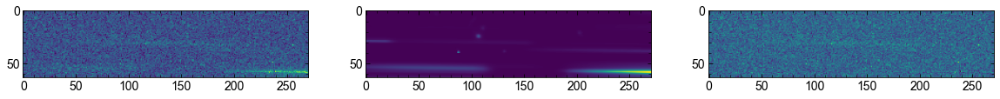

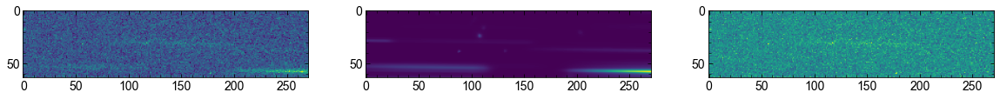

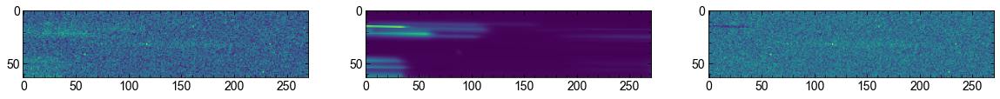

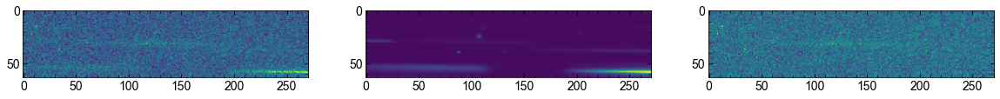

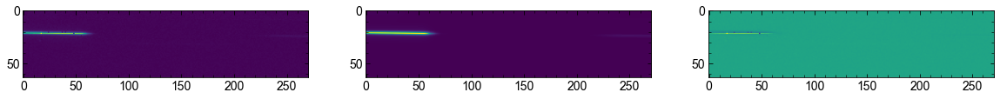

...

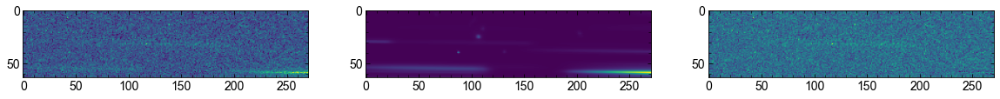

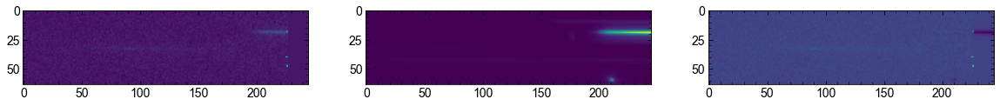

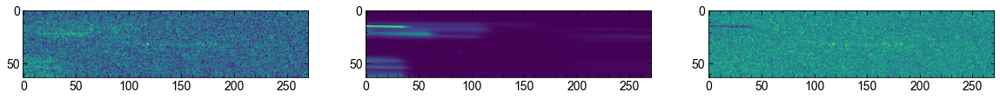

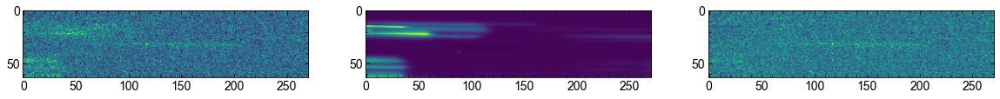

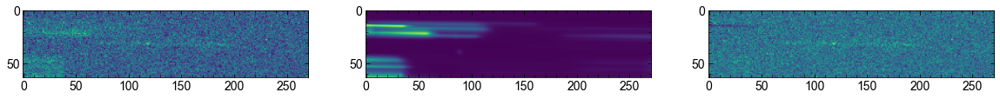

In [41]:
from matplotlib import gridspec
for beam in mb.beams:
    plt.figure(figsize = [20,5])
    gs = gridspec.GridSpec(1,3)
    ax1 = plt.subplot(gs[0])
    ax2 = plt.subplot(gs[1])
    ax3 = plt.subplot(gs[2])


    ax1.imshow(beam.grism.data['SCI'])
    ax2.imshow(beam.contam)
    ax3.imshow(beam.grism.data['SCI'] - beam.contam)

  0.7000   34335.5 (0.7000)
  0.7171   34334.6 (0.7171)
  0.7343   34337.1 (0.7171)
  0.7518   34336.2 (0.7171)
  0.7694   34335.8 (0.7171)
  0.7872   34336.3 (0.7171)
  0.8051   34340.4 (0.7171)
  0.8233   34340.9 (0.7171)
  0.8416   34338.1 (0.7171)
  0.8601   34329.2 (0.8601)
  0.8788   34294.8 (0.8788)
  0.8977   33946.4 (0.8977)
  0.9167   34320.0 (0.8977)
  0.9360   34346.9 (0.8977)
First iteration: z_best=0.8977

- 0.8774   34300.9 (0.8774) 1/41
- 0.8784   34296.6 (0.8784) 2/41
- 0.8794   34291.0 (0.8794) 3/41
- 0.8804   34283.7 (0.8804) 4/41
- 0.8814   34274.0 (0.8814) 5/41
- 0.8824   34261.4 (0.8824) 6/41
- 0.8834   34244.8 (0.8834) 7/41
- 0.8844   34223.3 (0.8844) 8/41
- 0.8854   34195.9 (0.8854) 9/41
- 0.8864   34162.3 (0.8864) 10/41
- 0.8874   34122.6 (0.8874) 11/41
- 0.8884   34078.0 (0.8884) 12/41
- 0.8894   34030.9 (0.8894) 13/41
- 0.8904   33984.4 (0.8904) 14/41
- 0.8914   33942.5 (0.8914) 15/41
- 0.8924   33909.2 (0.8924) 16/41
- 0.8934   33887.8 (0.8934) 17/41
- 0.894

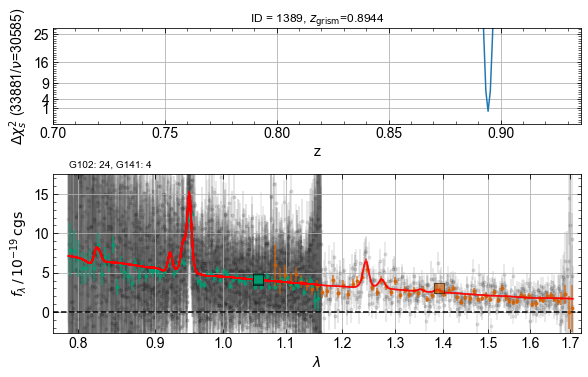

In [51]:
zfit = mb.fit_redshift(zr = [0.7,0.95], dz = [0.01,0.001])
print(zfit[0]['zbest'])

In [54]:
## Here we will do a template fit 

temps = mb.template_at_z(zfit[0]['zbest'], templates = args['t1'], fitter='lstsq')

In [55]:
## the template fits include a fit to the backgroud for every beam,
## stellar populations, and emission lines
temps

OrderedDict([('cont1d', <grizli.utils.SpectrumTemplate at 0x1adcb7a6d8>),
             ('line1d', <grizli.utils.SpectrumTemplate at 0x1adcb7ac18>),
             ('cfit',
              OrderedDict([('bg 000',
                            (-0.006316017527236685, 0.0008519897411031878)),
                           ('bg 001',
                            (-0.003453687068842158, 0.0008806298282525278)),
                           ('bg 002',
                            (-0.005128712822337643, 0.000915527861638036)),
                           ('bg 003',
                            (-0.0026141041899025927, 0.0008212508777339816)),
                           ('bg 004',
                            (-0.005982991364120137, 0.0008384373962844877)),
                           ('bg 005',
                            (-0.005412039846346382, 0.0008423974164082419)),
                           ('bg 006',
                            (-0.003357700314599442, 0.0011113995646350996)),
                         

In [56]:
## here we can generate a table using our fits

sptbl = mb.oned_spectrum(tfit = temps)

In [57]:
sptbl['G102']

wave,flux,err,npix,flat,contam,line,cont
Angstrom,ct / s,ct / s,,Angstrom cm2 ct / erg,ct / s,ct / s,ct / s
float64,float64,float64,int64,float64,float64,float64,float64
7709.083226562024,0.0,0.0,0,0.0,0.0,0.0,0.0
7727.271106774711,0.0,0.0,0,0.0,0.0,0.0,0.0
7745.501891710592,0.0,0.0,0,0.0,0.0,0.0,0.0
7763.775682580761,0.0,0.0,0,0.0,0.0,0.0,0.0
7782.092580835067,0.0,0.0,0,0.0,0.0,0.0,0.0
7800.452688162677,0.0,0.0,0,0.0,0.0,0.0,0.0
7818.85610649264,0.0,0.0,0,0.0,0.0,0.0,0.0
7837.302937994453,0.0,0.0,0,0.0,0.0,0.0,0.0


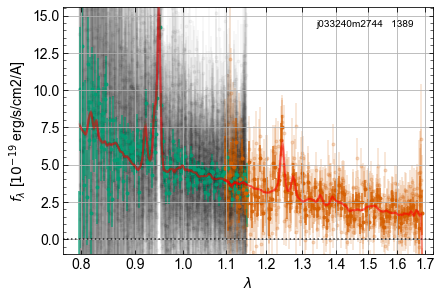

In [64]:
fig = mb.oned_figure(tfit = temps)